<a href="https://colab.research.google.com/github/astrrr/Right-Posture-Model/blob/main/model_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [89]:
import os
import matplotlib.pyplot as plt
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import layers
from tensorflow.keras.applications.inception_v3 import InceptionV3
import pandas as pd
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications import NASNetMobile



# Preprocessing data




In [90]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [91]:
CWD = os.getcwd().replace('\\','/') # get current workspace directory

In [92]:
train = ImageDataGenerator(rescale= 1/255)
validation = ImageDataGenerator(rescale= 1/255)

In [93]:
train_dataset = train.flow_from_directory("/content/drive/MyDrive/data_pose/train",
                                          target_size=(224,224),
                                          batch_size = 64,
                                          class_mode ="categorical")

validation_dataset = validation.flow_from_directory("/content/drive/MyDrive/data_pose/validation",
                                          target_size=(224,224),
                                          batch_size = 64,
                                          class_mode ="categorical")

Found 3165 images belonging to 2 classes.
Found 652 images belonging to 2 classes.




*   Class indice



In [94]:
train_dataset.class_indices

{'correct': 0, 'incorrect': 1}

In [95]:
validation_dataset.class_indices

{'correct': 0, 'incorrect': 1}

# Setup Model

In [96]:
MNV2 = MobileNetV2(alpha=1.4,include_top=False, weights='imagenet', input_tensor=None,
    input_shape=(224,224,3), pooling=max ,classifier_activation="softmax"
   )

MNV2.trainable = False

In [97]:
model = tf.keras.models.Sequential([
                                    MNV2,
                                    tf.keras.layers.Flatten(),
                                    tf.keras.layers.Dense(32, activation='relu'),
                                    #tf.keras.layers.Dropout(0.5),
                                    tf.keras.layers.Dense(16, activation='relu'),
                                    #tf.keras.layers.Dropout(0.3),
                                    tf.keras.layers.Dense(8, activation='relu'),
                                    #tf.keras.layers.Dropout(0.2),
                                   
                                    tf.keras.layers.Dense(2, activation='softmax')
                                    
                                    
])

In [98]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.40_224 (Funct  (None, 7, 7, 1792)       4363712   
 ional)                                                          
                                                                 
 flatten_5 (Flatten)         (None, 87808)             0         
                                                                 
 dense_20 (Dense)            (None, 32)                2809888   
                                                                 
 dense_21 (Dense)            (None, 16)                528       
                                                                 
 dense_22 (Dense)            (None, 8)                 136       
                                                                 
 dense_23 (Dense)            (None, 2)                 18        
                                                      

In [99]:
opt = tf.keras.optimizers.Adam(learning_rate=0.00005, name='Adam') 
los = tf.keras.losses.binary_crossentropy 
  

model.compile(optimizer=opt, loss=los, metrics=['accuracy'])

In [100]:
model.fit(
    train_dataset, # both data and label cause we use ImageDataGenerator
    batch_size=64,
    epochs=50, ### can be change 
    validation_data= validation_dataset,
    
    shuffle=True 
)


Epoch 1/50
50/50 [==============================] - 26s 458ms/step - loss: 0.3994 - accuracy: 0.8319 - val_loss: 0.2318 - val_accuracy: 0.9279
Epoch 2/50
50/50 [==============================] - 22s 429ms/step - loss: 0.1207 - accuracy: 0.9700 - val_loss: 0.1494 - val_accuracy: 0.9540
Epoch 3/50
50/50 [==============================] - 22s 428ms/step - loss: 0.0534 - accuracy: 0.9956 - val_loss: 0.1266 - val_accuracy: 0.9617
Epoch 4/50
50/50 [==============================] - 22s 438ms/step - loss: 0.0276 - accuracy: 0.9997 - val_loss: 0.1115 - val_accuracy: 0.9678
Epoch 5/50
50/50 [==============================] - 22s 436ms/step - loss: 0.0165 - accuracy: 1.0000 - val_loss: 0.1205 - val_accuracy: 0.9601
Epoch 6/50
50/50 [==============================] - 22s 433ms/step - loss: 0.0113 - accuracy: 1.0000 - val_loss: 0.1115 - val_accuracy: 0.9632
Epoch 7/50
50/50 [==============================] - 21s 426ms/step - loss: 0.0081 - accuracy: 1.0000 - val_loss: 0.1162 - val_accuracy: 0.9632

# save model

In [101]:

model.save(f'{CWD}/Model/MN_Fix_angle_no_aug') #RENAME DIR OF MODEL

INFO:tensorflow:Assets written to: /content/Model/MN_Fix_angle_no_aug/assets


INFO:tensorflow:Assets written to: /content/Model/MN_Fix_angle_no_aug/assets
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


In [102]:
print(model.history.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


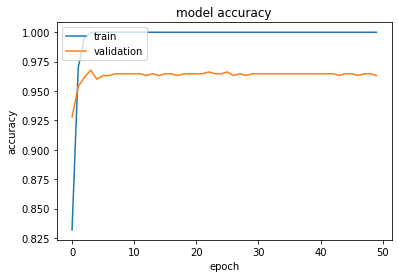

In [103]:
plt.plot(model.history.history['accuracy'])
plt.plot(model.history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

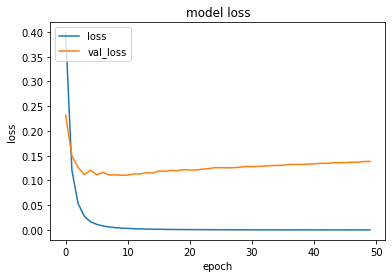

In [104]:
plt.plot(model.history.history['loss'])
plt.plot(model.history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['loss', 'val_loss'], loc='upper left')
plt.show()

# Prediction

In [105]:
dir_path = '/content/drive/MyDrive/data_fix_angle_no_aug/test'

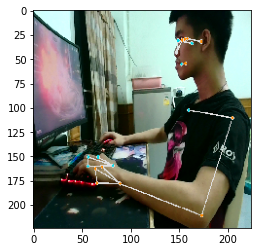

model prediction : correct
0.9739983081817627
0.026001693680882454
[[0.9739983  0.02600169]] kridsanapong_correct_86.png


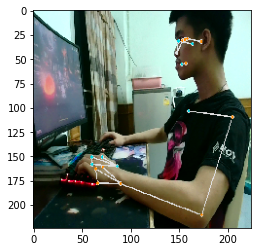

model prediction : incorrect
0.007869924418628216
0.9921301007270813
[[0.00786992 0.9921301 ]] kridsanapong_correct_85.png


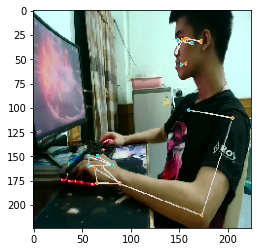

model prediction : correct
0.8262372016906738
0.1737627536058426
[[0.8262372  0.17376275]] kridsanapong_correct_87.png


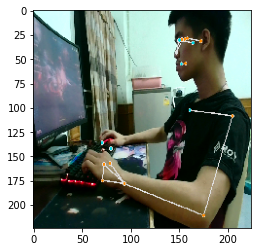

model prediction : correct
0.9952017068862915
0.00479831313714385
[[0.9952017  0.00479831]] kridsanapong_correct_88.png


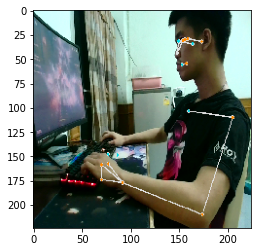

model prediction : incorrect
0.41917943954467773
0.5808205604553223
[[0.41917944 0.58082056]] kridsanapong_correct_91.png


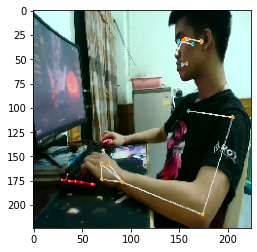

model prediction : incorrect
0.167486310005188
0.832513689994812
[[0.16748631 0.8325137 ]] kridsanapong_correct_89.png


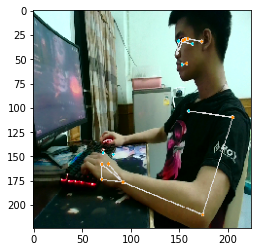

model prediction : incorrect
0.20813855528831482
0.7918614745140076
[[0.20813856 0.7918615 ]] kridsanapong_correct_90.png


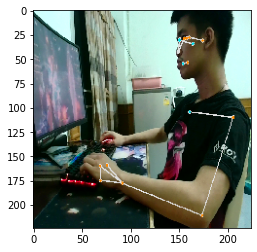

model prediction : correct
0.9124652743339539
0.08753469586372375
[[0.9124653 0.0875347]] kridsanapong_correct_92.png


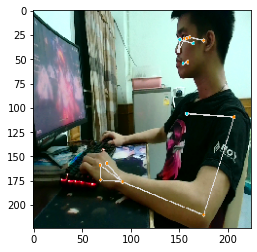

model prediction : incorrect
0.10882087051868439
0.8911791443824768
[[0.10882087 0.89117914]] kridsanapong_correct_93.png


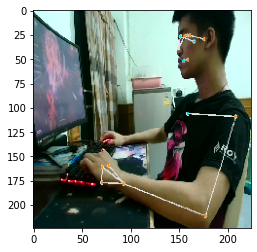

model prediction : correct
0.9880466461181641
0.011953329667448997
[[0.98804665 0.01195333]] kridsanapong_correct_95.png


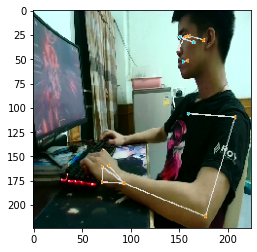

model prediction : correct
0.515758752822876
0.48424118757247925
[[0.51575875 0.4842412 ]] kridsanapong_correct_94.png


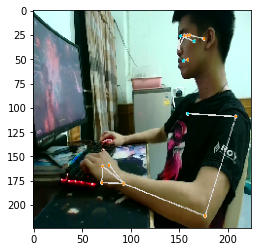

model prediction : correct
0.9984785914421082
0.0015214236918836832
[[0.9984786  0.00152142]] kridsanapong_correct_96.png


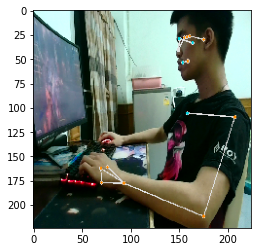

model prediction : correct
0.5089346170425415
0.4910653829574585
[[0.5089346  0.49106538]] kridsanapong_correct_97.png


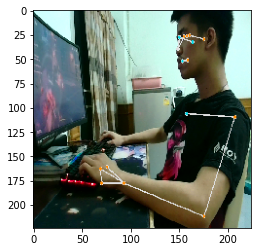

model prediction : correct
0.9998660087585449
0.00013391811808105558
[[9.9986601e-01 1.3391812e-04]] kridsanapong_correct_98.png


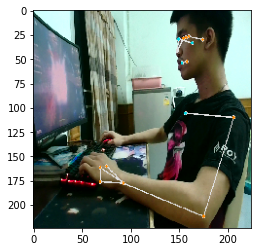

model prediction : correct
0.8453083038330078
0.15469174087047577
[[0.8453083  0.15469174]] kridsanapong_correct_99.png


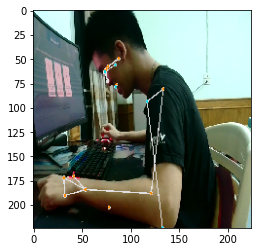

model prediction : incorrect
0.0033452382776886225
0.996654748916626
[[0.00334524 0.99665475]] kridsanapong_incorrect_85.png


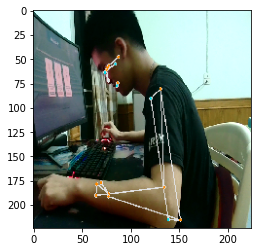

model prediction : incorrect
0.3463333547115326
0.6536666750907898
[[0.34633335 0.6536667 ]] kridsanapong_incorrect_86.png


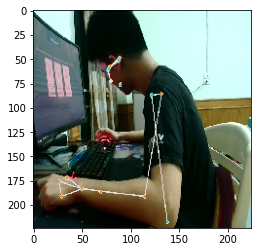

model prediction : correct
0.9636428356170654
0.03635714575648308
[[0.96364284 0.03635715]] kridsanapong_incorrect_87.png


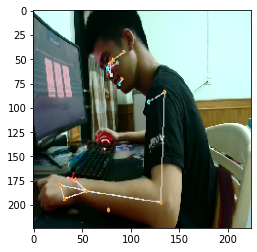

model prediction : incorrect
0.10542808473110199
0.8945719003677368
[[0.10542808 0.8945719 ]] kridsanapong_incorrect_88.png


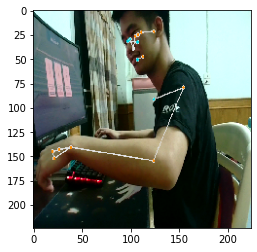

model prediction : correct
0.8704704642295837
0.12952958047389984
[[0.87047046 0.12952958]] kridsanapong_incorrect_89.png


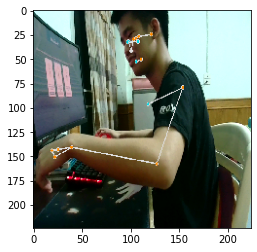

model prediction : correct
0.5810571312904358
0.4189428985118866
[[0.58105713 0.4189429 ]] kridsanapong_incorrect_91.png


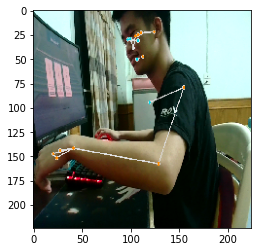

model prediction : incorrect
0.1880282312631607
0.8119717836380005
[[0.18802823 0.8119718 ]] kridsanapong_incorrect_90.png


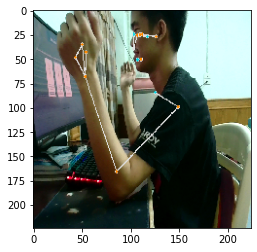

model prediction : incorrect
8.12068890354567e-07
0.9999991655349731
[[8.1206889e-07 9.9999917e-01]] kridsanapong_incorrect_93.png


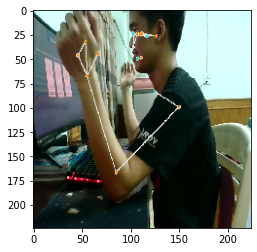

model prediction : incorrect
0.001509023248218
0.9984909296035767
[[0.00150902 0.9984909 ]] kridsanapong_incorrect_92.png


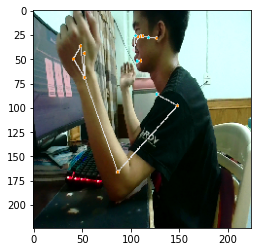

model prediction : incorrect
5.651374976878287e-07
0.9999994039535522
[[5.651375e-07 9.999994e-01]] kridsanapong_incorrect_95.png


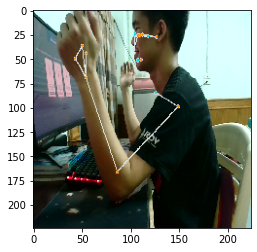

model prediction : incorrect
7.61126557335956e-06
0.9999923706054688
[[7.6112656e-06 9.9999237e-01]] kridsanapong_incorrect_94.png


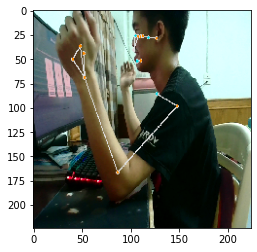

model prediction : incorrect
5.650261300615966e-06
0.9999943971633911
[[5.6502613e-06 9.9999440e-01]] kridsanapong_incorrect_96.png


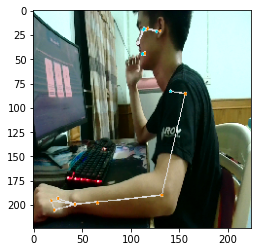

model prediction : incorrect
0.00324237416498363
0.9967576861381531
[[0.00324237 0.9967577 ]] kridsanapong_incorrect_97.png


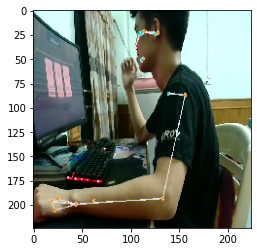

model prediction : incorrect
0.4929260015487671
0.5070739984512329
[[0.492926 0.507074]] kridsanapong_incorrect_99.png


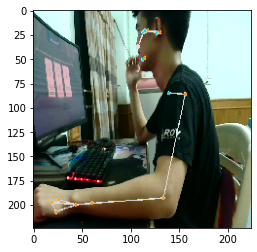

model prediction : incorrect
0.002757859416306019
0.9972420930862427
[[0.00275786 0.9972421 ]] kridsanapong_incorrect_98.png


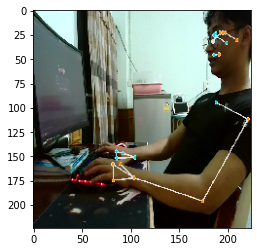

model prediction : incorrect
0.00462319003418088
0.9953768253326416
[[0.00462319 0.9953768 ]] sek_at_jamesRoom_correct_90.png


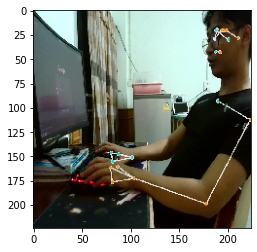

model prediction : incorrect
0.06930775195360184
0.930692195892334
[[0.06930775 0.9306922 ]] sek_at_jamesRoom_correct_91.png


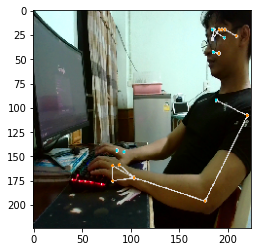

model prediction : incorrect
0.06829016655683517
0.931709885597229
[[0.06829017 0.9317099 ]] sek_at_jamesRoom_correct_94.png


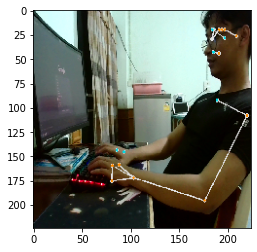

model prediction : incorrect
0.11113698780536652
0.8888629674911499
[[0.11113699 0.88886297]] sek_at_jamesRoom_correct_93.png


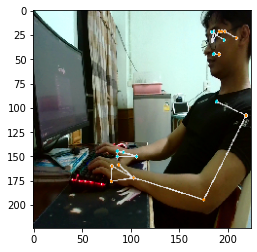

model prediction : incorrect
0.0030966834165155888
0.9969032406806946
[[0.00309668 0.99690324]] sek_at_jamesRoom_correct_92.png


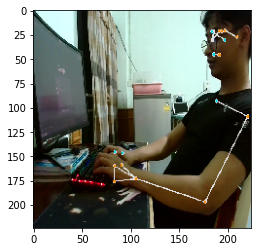

model prediction : incorrect
0.23041027784347534
0.7695897221565247
[[0.23041028 0.7695897 ]] sek_at_jamesRoom_correct_95.png


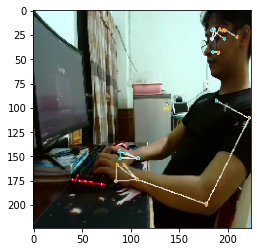

model prediction : incorrect
0.007060886360704899
0.9929391145706177
[[0.00706089 0.9929391 ]] sek_at_jamesRoom_correct_96.png


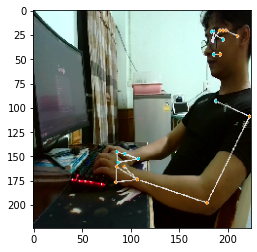

model prediction : incorrect
0.00047480425564572215
0.9995251893997192
[[4.7480426e-04 9.9952519e-01]] sek_at_jamesRoom_correct_97.png


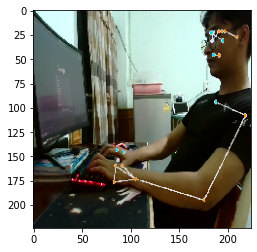

model prediction : incorrect
0.13330517709255219
0.8666948080062866
[[0.13330518 0.8666948 ]] sek_at_jamesRoom_correct_98.png


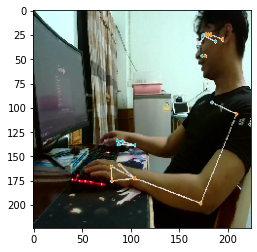

model prediction : correct
0.7715212106704712
0.2284788340330124
[[0.7715212  0.22847883]] sek_at_jamesRoom_correct_101.png


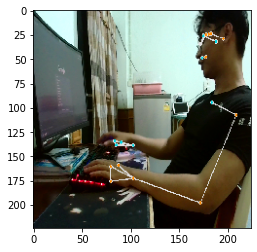

model prediction : incorrect
0.25853675603866577
0.7414632439613342
[[0.25853676 0.74146324]] sek_at_jamesRoom_correct_100.png


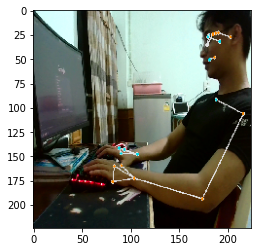

model prediction : incorrect
6.789567123632878e-05
0.999932050704956
[[6.7895671e-05 9.9993205e-01]] sek_at_jamesRoom_correct_99.png


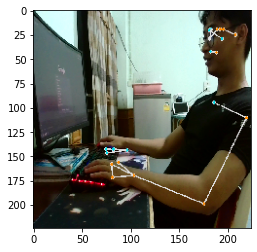

model prediction : incorrect
0.009022624231874943
0.99097740650177
[[0.00902262 0.9909774 ]] sek_at_jamesRoom_correct_102.png


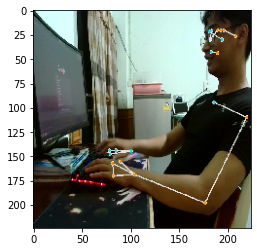

model prediction : incorrect
0.22287672758102417
0.7771233320236206
[[0.22287673 0.77712333]] sek_at_jamesRoom_correct_103.png


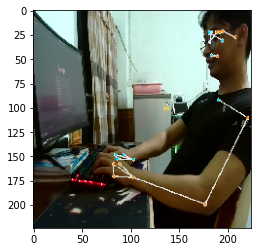

model prediction : incorrect
0.000312145275529474
0.999687910079956
[[3.1214528e-04 9.9968791e-01]] sek_at_jamesRoom_correct_104.png


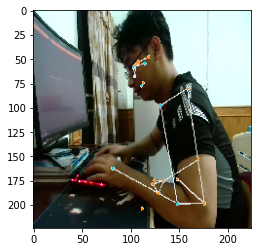

model prediction : correct
0.9966168999671936
0.003383120521903038
[[0.9966169  0.00338312]] sek_at_jamesRoom_incorrect_85.png


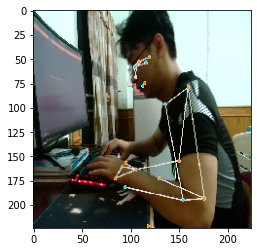

model prediction : correct
0.9893369674682617
0.010663059540092945
[[0.98933697 0.01066306]] sek_at_jamesRoom_incorrect_86.png


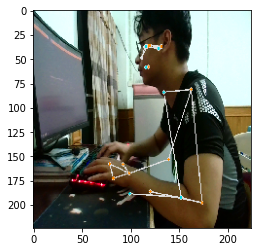

model prediction : incorrect
0.0021971536334604025
0.9978027939796448
[[0.00219715 0.9978028 ]] sek_at_jamesRoom_incorrect_87.png


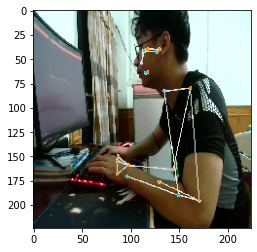

model prediction : correct
0.9171053171157837
0.08289475739002228
[[0.9171053  0.08289476]] sek_at_jamesRoom_incorrect_88.png


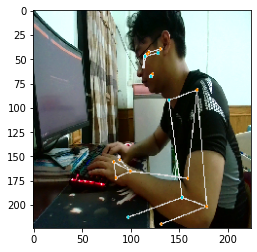

model prediction : correct
0.9989566802978516
0.0010432770941406488
[[0.9989567  0.00104328]] sek_at_jamesRoom_incorrect_89.png


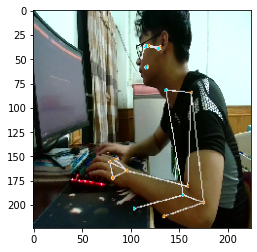

model prediction : incorrect
0.009027617983520031
0.9909723997116089
[[0.00902762 0.9909724 ]] sek_at_jamesRoom_incorrect_90.png


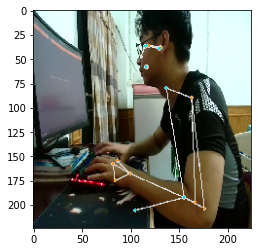

model prediction : incorrect
0.000458572874777019
0.9995414018630981
[[4.5857287e-04 9.9954140e-01]] sek_at_jamesRoom_incorrect_91.png


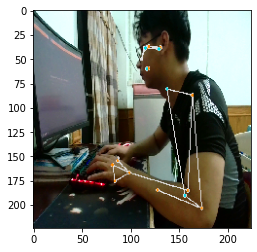

model prediction : incorrect
0.12531942129135132
0.8746805191040039
[[0.12531942 0.8746805 ]] sek_at_jamesRoom_incorrect_92.png


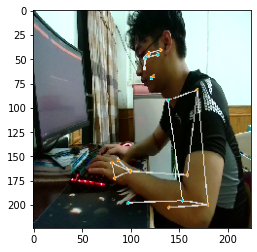

model prediction : incorrect
0.4795187711715698
0.520481288433075
[[0.47951877 0.5204813 ]] sek_at_jamesRoom_incorrect_93.png


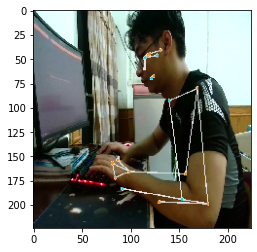

model prediction : correct
0.9683387279510498
0.0316612534224987
[[0.9683387  0.03166125]] sek_at_jamesRoom_incorrect_94.png


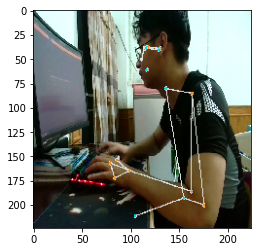

model prediction : incorrect
0.13747230172157288
0.8625276684761047
[[0.1374723  0.86252767]] sek_at_jamesRoom_incorrect_95.png


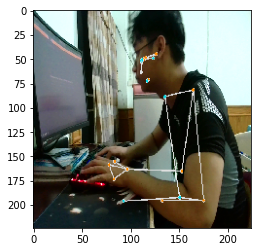

model prediction : correct
0.5178185105323792
0.48218145966529846
[[0.5178185  0.48218146]] sek_at_jamesRoom_incorrect_96.png


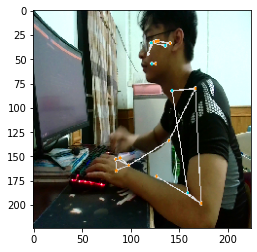

model prediction : incorrect
0.0005508777685463428
0.9994490742683411
[[5.5087777e-04 9.9944907e-01]] sek_at_jamesRoom_incorrect_97.png


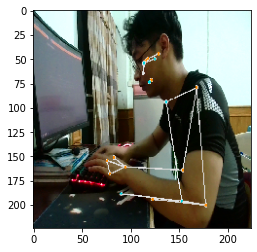

model prediction : correct
0.9929798245429993
0.007020240183919668
[[0.9929798  0.00702024]] sek_at_jamesRoom_incorrect_98.png


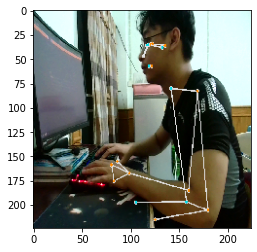

model prediction : incorrect
0.010162618942558765
0.9898374676704407
[[0.01016262 0.98983747]] sek_at_jamesRoom_incorrect_99.png


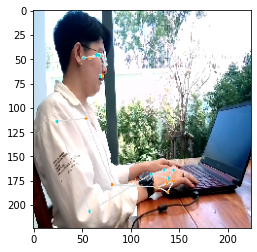

model prediction : incorrect
5.9022626373916864e-05
0.9999409914016724
[[5.9022626e-05 9.9994099e-01]] Pjo_correct_85.png


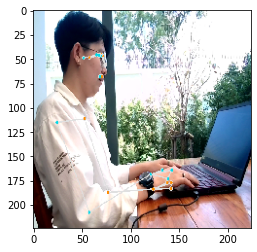

model prediction : correct
0.5624117851257324
0.4375881850719452
[[0.5624118  0.43758819]] Pjo_correct_87.png


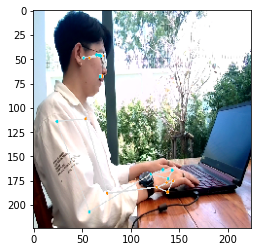

model prediction : incorrect
0.40781012177467346
0.5921899080276489
[[0.40781012 0.5921899 ]] Pjo_correct_86.png


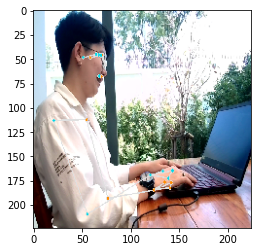

model prediction : incorrect
0.002296537160873413
0.997703492641449
[[0.00229654 0.9977035 ]] Pjo_correct_88.png


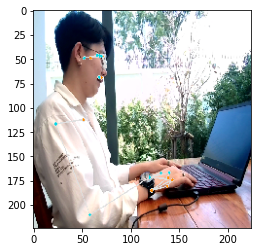

model prediction : incorrect
0.01270713284611702
0.9872928857803345
[[0.01270713 0.9872929 ]] Pjo_correct_89.png


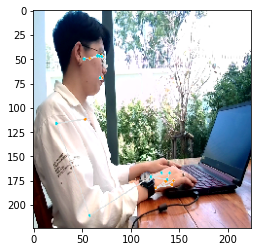

model prediction : incorrect
0.2673664391040802
0.7326335906982422
[[0.26736644 0.7326336 ]] Pjo_correct_90.png


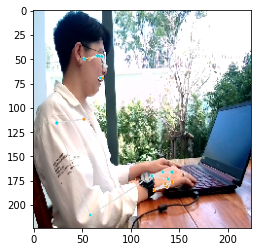

model prediction : incorrect
0.0006236810004338622
0.9993763566017151
[[6.2368100e-04 9.9937636e-01]] Pjo_correct_91.png


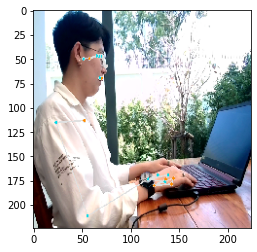

model prediction : incorrect
0.04700799658894539
0.9529919624328613
[[0.047008   0.95299196]] Pjo_correct_92.png


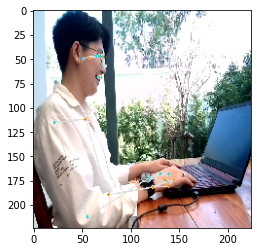

model prediction : incorrect
0.0015653647715225816
0.9984346032142639
[[0.00156536 0.9984346 ]] Pjo_correct_93.png


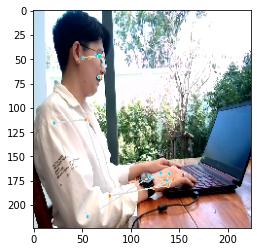

model prediction : incorrect
0.233529195189476
0.7664707899093628
[[0.2335292 0.7664708]] Pjo_correct_94.png


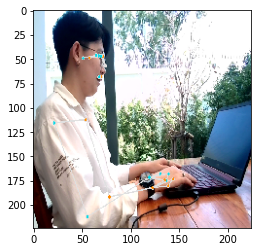

model prediction : incorrect
0.006616376340389252
0.9933835864067078
[[0.00661638 0.9933836 ]] Pjo_correct_95.png


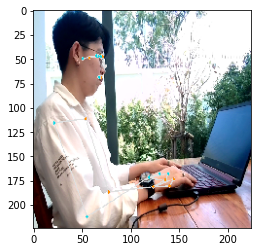

model prediction : correct
0.8513374924659729
0.14866255223751068
[[0.8513375  0.14866255]] Pjo_correct_96.png


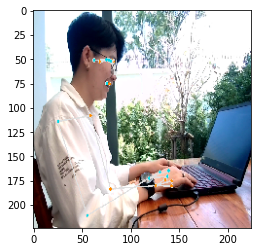

model prediction : incorrect
0.05592367798089981
0.9440762996673584
[[0.05592368 0.9440763 ]] Pjo_correct_98.png


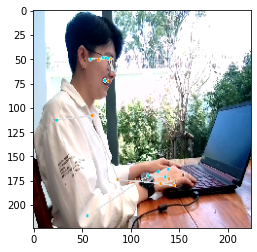

model prediction : incorrect
0.0005236464203335345
0.9994763731956482
[[5.236464e-04 9.994764e-01]] Pjo_correct_97.png


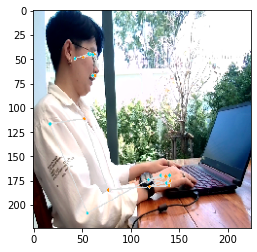

model prediction : incorrect
0.010237242095172405
0.9897627830505371
[[0.01023724 0.9897628 ]] Pjo_correct_99.png


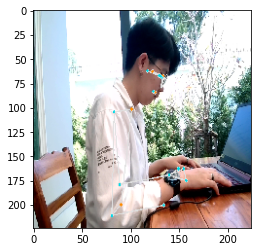

model prediction : incorrect
1.7904938431456685e-05
0.9999821186065674
[[1.7904938e-05 9.9998212e-01]] Pjo_incorrect_85.png


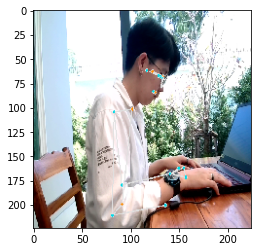

model prediction : incorrect
0.00018507814093027264
0.9998149275779724
[[1.8507814e-04 9.9981493e-01]] Pjo_incorrect_86.png


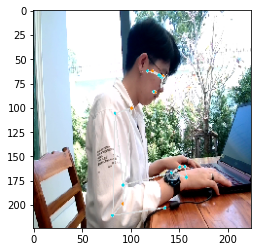

model prediction : incorrect
0.0029212990775704384
0.9970787763595581
[[0.0029213 0.9970788]] Pjo_incorrect_88.png


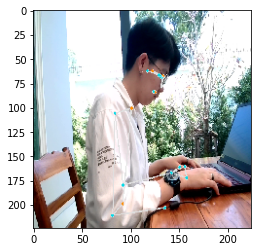

model prediction : incorrect
0.0005849319277331233
0.9994150400161743
[[5.8493193e-04 9.9941504e-01]] Pjo_incorrect_89.png


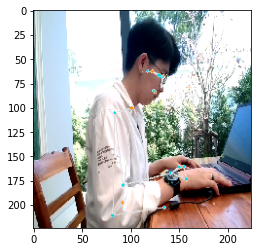

model prediction : incorrect
8.005868585314602e-05
0.9999198913574219
[[8.0058686e-05 9.9991989e-01]] Pjo_incorrect_87.png


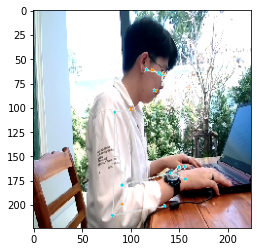

model prediction : incorrect
2.0727073206217028e-05
0.9999792575836182
[[2.0727073e-05 9.9997926e-01]] Pjo_incorrect_91.png


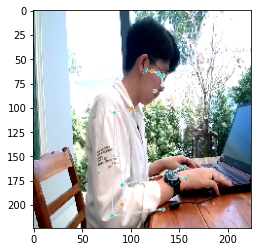

model prediction : incorrect
0.0012798815732821822
0.9987201690673828
[[0.00127988 0.99872017]] Pjo_incorrect_90.png


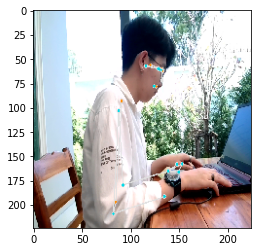

model prediction : incorrect
0.00011824686225736514
0.9998817443847656
[[1.1824686e-04 9.9988174e-01]] Pjo_incorrect_92.png


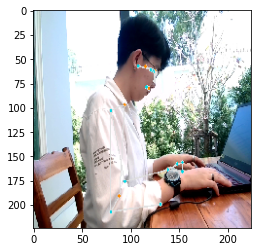

model prediction : incorrect
0.00013228319585323334
0.9998676776885986
[[1.322832e-04 9.998677e-01]] Pjo_incorrect_93.png


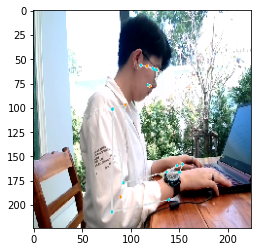

model prediction : incorrect
8.472542685922235e-05
0.9999152421951294
[[8.4725427e-05 9.9991524e-01]] Pjo_incorrect_94.png


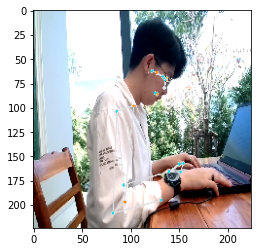

model prediction : incorrect
1.0489252417755779e-05
0.9999895095825195
[[1.0489252e-05 9.9998951e-01]] Pjo_incorrect_95.png


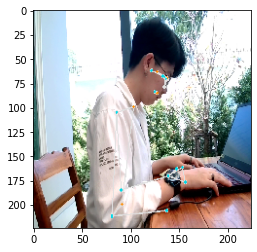

model prediction : incorrect
0.021711736917495728
0.9782882928848267
[[0.02171174 0.9782883 ]] Pjo_incorrect_96.png


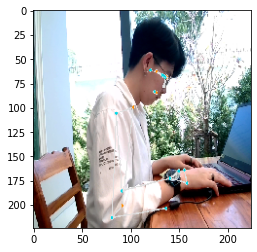

model prediction : incorrect
0.000151244574226439
0.9998487234115601
[[1.5124457e-04 9.9984872e-01]] Pjo_incorrect_97.png


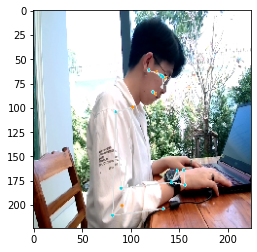

model prediction : incorrect
0.00014787893451284617
0.9998520612716675
[[1.4787893e-04 9.9985206e-01]] Pjo_incorrect_98.png


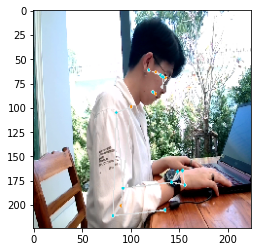

model prediction : incorrect
9.491670425632037e-06
0.9999904632568359
[[9.4916704e-06 9.9999046e-01]] Pjo_incorrect_99.png


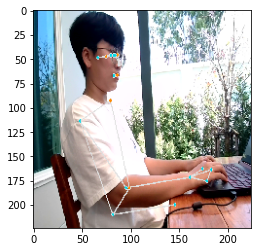

model prediction : incorrect
0.02106640487909317
0.978933572769165
[[0.0210664 0.9789336]] PBoung_correct_85.png


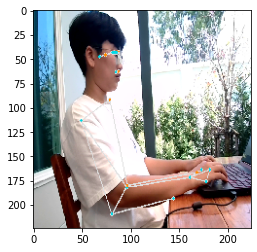

model prediction : incorrect
0.019037634134292603
0.980962336063385
[[0.01903763 0.98096234]] PBoung_correct_86.png


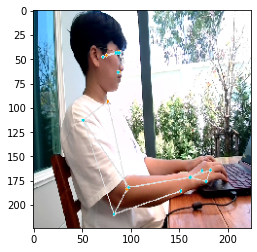

model prediction : incorrect
0.0030467987526208162
0.9969531297683716
[[0.0030468 0.9969531]] PBoung_correct_87.png


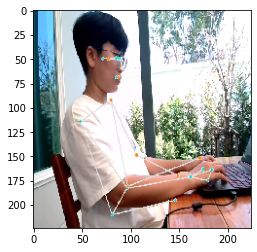

model prediction : incorrect
0.0029703646432608366
0.9970296621322632
[[0.00297036 0.99702966]] PBoung_correct_88.png


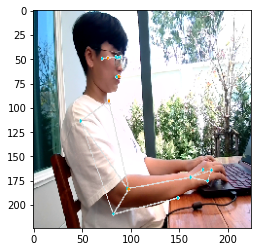

model prediction : incorrect
0.0012673487653955817
0.9987326264381409
[[0.00126735 0.9987326 ]] PBoung_correct_89.png


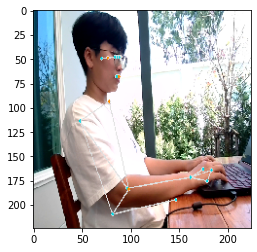

model prediction : incorrect
0.05271592363715172
0.9472841024398804
[[0.05271592 0.9472841 ]] PBoung_correct_90.png


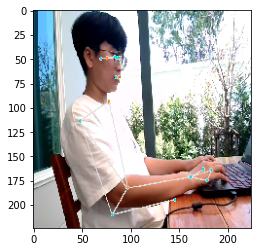

model prediction : incorrect
0.00015227952098939568
0.9998476505279541
[[1.5227952e-04 9.9984765e-01]] PBoung_correct_91.png


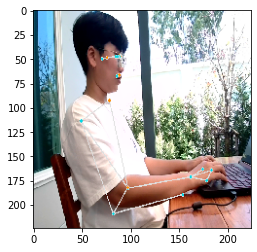

model prediction : incorrect
0.07188325375318527
0.9281167984008789
[[0.07188325 0.9281168 ]] PBoung_correct_92.png


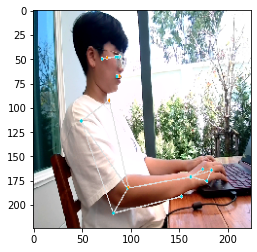

model prediction : incorrect
0.4969240725040436
0.5030759572982788
[[0.49692407 0.50307596]] PBoung_correct_93.png


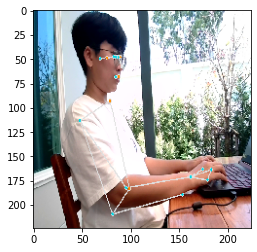

model prediction : incorrect
0.0003500506281852722
0.9996500015258789
[[3.5005063e-04 9.9965000e-01]] PBoung_correct_94.png


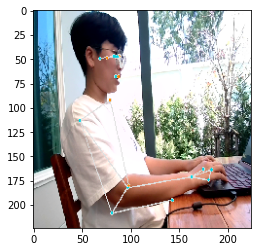

model prediction : incorrect
0.002913344418630004
0.9970867037773132
[[0.00291334 0.9970867 ]] PBoung_correct_95.png


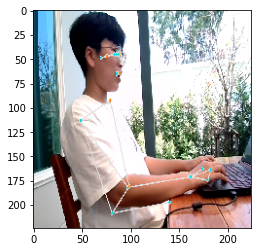

model prediction : incorrect
0.007058639544993639
0.9929413795471191
[[0.00705864 0.9929414 ]] PBoung_correct_96.png


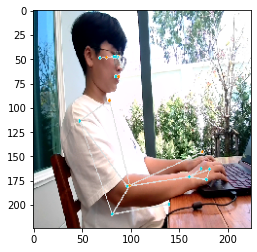

model prediction : incorrect
0.10464974492788315
0.8953502178192139
[[0.10464974 0.8953502 ]] PBoung_correct_97.png


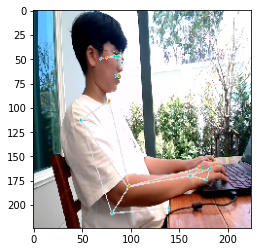

model prediction : incorrect
0.3554215133190155
0.6445785164833069
[[0.3554215 0.6445785]] PBoung_correct_98.png


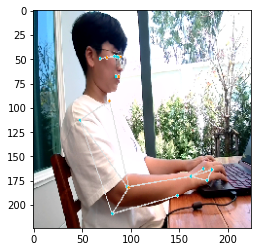

model prediction : incorrect
0.02473714016377926
0.9752628207206726
[[0.02473714 0.9752628 ]] PBoung_correct_99.png


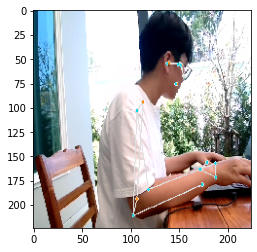

model prediction : incorrect
0.011779364198446274
0.9882206916809082
[[0.01177936 0.9882207 ]] PBoung_incorrect_85.png


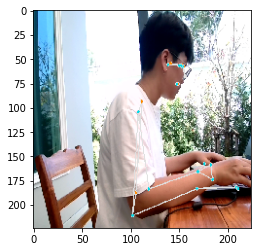

model prediction : incorrect
0.008425147272646427
0.9915748238563538
[[0.00842515 0.9915748 ]] PBoung_incorrect_86.png


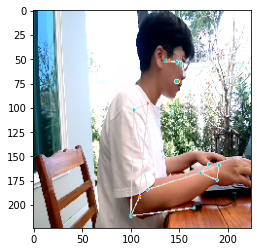

model prediction : incorrect
3.4791526559274644e-05
0.9999651908874512
[[3.4791527e-05 9.9996519e-01]] PBoung_incorrect_87.png


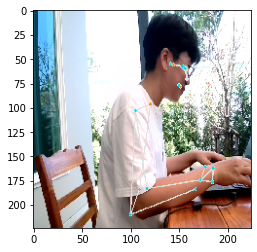

model prediction : incorrect
0.015655510127544403
0.9843444228172302
[[0.01565551 0.9843444 ]] PBoung_incorrect_88.png


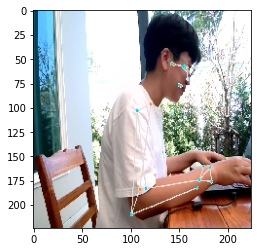

model prediction : incorrect
0.02216789871454239
0.9778320789337158
[[0.0221679 0.9778321]] PBoung_incorrect_89.png


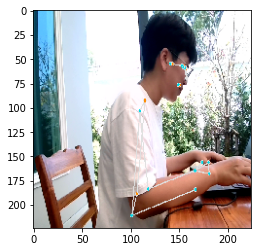

model prediction : incorrect
0.01374784018844366
0.9862521290779114
[[0.01374784 0.9862521 ]] PBoung_incorrect_91.png


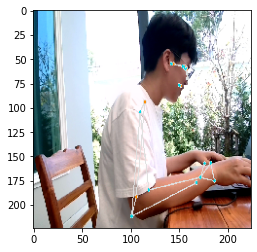

model prediction : incorrect
0.005032449495047331
0.994967520236969
[[0.00503245 0.9949675 ]] PBoung_incorrect_90.png


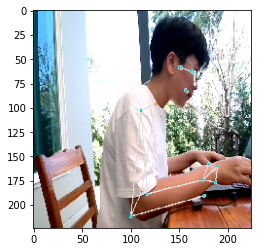

model prediction : incorrect
0.008091077208518982
0.991908848285675
[[0.00809108 0.99190885]] PBoung_incorrect_92.png


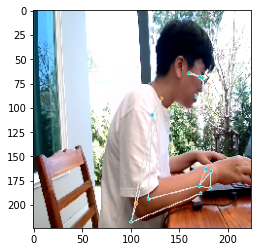

model prediction : incorrect
0.012740563601255417
0.9872593879699707
[[0.01274056 0.9872594 ]] PBoung_incorrect_93.png


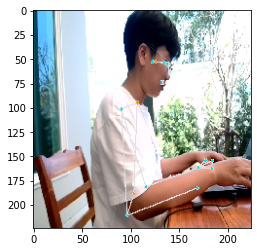

model prediction : incorrect
0.0019410103559494019
0.9980589747428894
[[0.00194101 0.998059  ]] PBoung_incorrect_94.png


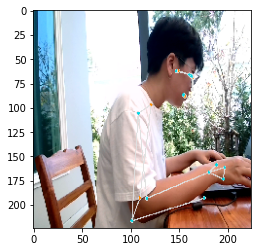

model prediction : incorrect
0.00011738294415408745
0.9998825788497925
[[1.17382944e-04 9.99882579e-01]] PBoung_incorrect_95.png


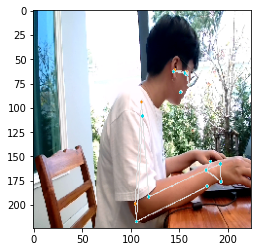

model prediction : incorrect
3.4488770324969664e-05
0.9999655485153198
[[3.4488770e-05 9.9996555e-01]] PBoung_incorrect_96.png


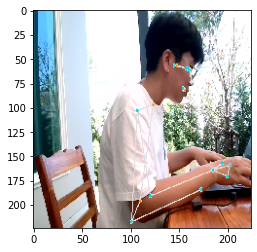

model prediction : incorrect
0.014909950084984303
0.9850900173187256
[[0.01490995 0.98509   ]] PBoung_incorrect_97.png


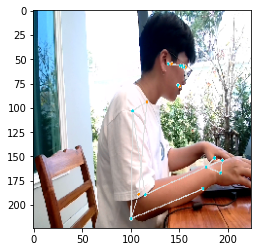

model prediction : incorrect
0.006277412176132202
0.9937226176261902
[[0.00627741 0.9937226 ]] PBoung_incorrect_98.png


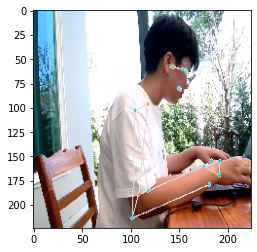

model prediction : incorrect
0.10138159990310669
0.8986184000968933
[[0.1013816 0.8986184]] PBoung_incorrect_99.png


In [106]:
correct =0
incorrect =0
total =0

TruePositive=0   #ทายว่า correct ออกมาเป็น corect
TrueNegative=0  #ทายว่า incorrect ออมาเป็น incorect
FalsePositive=0  #ทายว่า correct แต่ออกมาเป็น incorrect
FalseNegative=0  #ทายว่า incorrect แต่ออกมาเป็น correct

for i in os.listdir(dir_path):
    img = tf.keras.preprocessing.image.load_img(dir_path+'//'+i, target_size=(224,224))
    plt.imshow(img)
    plt.show()

    X= tf.keras.preprocessing.image.img_to_array(img)
    X= np.expand_dims(X,axis=0)
    image = np.vstack([X])
    val = model.predict(image)

    #correct > incorrect
    if float(val[0][0]) > float(val[0][1]):
        total +=1
        if 'cor' in i:
            correct +=1
            TruePositive +=1
        else:
            incorrect +=1
            FalsePositive +=1
        print('model prediction : correct')

    #incorrect > correct
    elif float(val[0][0]) < float(val[0][1]):
        total +=1
        if 'in' in i:
          correct +=1
          TrueNegative +=1
        else:
          incorrect +=1
          FalseNegative +=1
        print('model prediction : incorrect')  

    
    print(float(val[0][0]))
    print(float(val[0][1]))
    print(val,i)

In [107]:
print(val)
print(val[0][0])
print(val[0][1])

[[0.1013816 0.8986184]]
0.1013816
0.8986184


In [108]:
print(correct)
print(incorrect)

73
47


# Accuracy conclusion

In [109]:
print('correct  : {:.2%}'.format(correct/total))
print('incorrect: {:.2%}'.format(incorrect/total))

correct  : 60.83%
incorrect: 39.17%


In [110]:
print('actual : ', total)
print('true positive : ', TruePositive)
print('true negative : ', TrueNegative)
print('false positive : ', FalsePositive)
print('false negative : ', FalseNegative)

actual :  120
true positive :  23
true negative :  50
false positive :  0
false negative :  47


# Precision & Recall
ของการตรวจท่าที่ถูก

In [111]:
preCor = TruePositive/(TruePositive+FalsePositive)
reCor = TruePositive/(TruePositive+FalseNegative)
f1Cor = 2*((preCor*reCor)/(preCor+reCor))
print('precision : ', preCor)
print('recall    : ', reCor)
print('f1        : ', f1Cor)

precision :  1.0
recall    :  0.32857142857142857
f1        :  0.4946236559139785


# Precision & Recall
ของการตรวจท่าที่ผิด

In [112]:
preIn = TrueNegative/(TrueNegative+FalseNegative)
reIn = TrueNegative/(TrueNegative+FalsePositive)
f1In = 2*((preIn*reIn)/(preIn+reIn))

print('precision : ', preIn)
print('recall    : ', reIn)
print('f1        : ', f1In)

precision :  0.5154639175257731
recall    :  1.0
f1        :  0.6802721088435374


In [113]:
!pip install line-bot-sdk

In [114]:
from linebot import LineBotApi
from linebot.models import TextSendMessage
from linebot.exceptions import LineBotApiError

line_bot_api = LineBotApi('ZRjyjNwSVRqlhznKRP7Ls7IUV8pgmyUxdGnBGMfEf6teuPM+qtWQg8BuOwnsUUAEC6h7RRTRssYO4Gt2NguYF7etzhJiU0JBWZdfdAbIkFxHalnIumMN/8710BIrVnn3Xj7NxjcHkbq8I8b20s36VQdB04t89/1O/w1cDnyilFU=')

try:
    line_bot_api.push_message('Ua8dbc2f97b9014c36aac262f1a8bd285', TextSendMessage(text='Train เสร็จแล้ว !!'))
except LineBotApiError as e:
    # error handle
    ...